# Projet DATA732
## Text Clustering by Latent Dirichlet Allocation with CountVectorizer
Clusters of the articles description by the contents

## 0) Pre config

In [1]:
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd
import numpy as np
import string

from nltk.corpus import stopwords

from IPython.display import display
from collections import Counter

import matplotlib.pyplot as plt

from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import scipy.stats as stats

from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE

from bokeh.plotting import figure, show
from bokeh.models import Label
from bokeh.io import output_notebook
from bokeh.models import Label
output_notebook()

%matplotlib inline

Loading BokehJS ...

## 1) Data
Data extraction from pre-generated df 

In [2]:
df = pd.read_json('./new_df/df_kws_article.json', orient='records')
# df = pd.read_json('./new_df/df_multiple_articles.json', orient='records')

In [3]:
df['date'] = pd.to_datetime(df[['year', 'month', 'day']])

In [4]:
numberArticles = df.shape[0]
print(f'Number of articles: {numberArticles}')

Number of articles: 965


In [5]:
none_count = df['description'].isna().sum()
print(f"number None type in description: {none_count}")
print(f'Porcentage of None value in total: {100*none_count/df.shape[0]:.2f} %')

df = df.dropna(subset=['description'])

number None type in description: 0
Porcentage of None value in total: 0.00 %


### 1.1) Text Cleaning 

In [6]:
df['CleanedData']=df['content'].str.lower()
df['CleanedData'] = df['CleanedData'].str.replace('[{}]'.format(string.punctuation), '', regex=True)
df.head(5)

,year,month,day,url,title,description,content,lang,kws,locations,miscellaneus,organizations,persons,domain,date,CleanedData
0,2019,1,2,https://french.presstv.ir/Detail/2019/01/03/58...,Des terroristes de l'Armée syrienne libre envo...,Certains membres de l’Armée syrienne libre (AS...,Depuis que les Etats-Unis ont annoncé vouloir ...,fr,"{'algérie': 10, 'afrique': 6, 'terroriste': 6,...","{'Etats-Unis': 4, 'France': 2, 'Syrie': 4, 'Al...",{},"{'Moyen-Orient': 2, 'ASL': 2, 'Daech': 2}",{},french.presstv.ir,2019-01-02,depuis que les etatsunis ont annoncé vouloir c...
1,2019,1,3,https://french.presstv.ir/Detail/2019/01/04/58...,Zoom Afrique du 4 janvier 2019,"Au Soudan, les manifestations contre el-Béchir...",Dans ce numéro de Zoom Afrique : L’actualité e...,fr,"{'niger': 4, 'occidental': 4, 'burkina': 3, 'p...","{'Niger': 2, 'Burkina Faso': 2}",{},{},{'el-Béchir': 2},french.presstv.ir,2019-01-03,dans ce numéro de zoom afrique l’actualité en...
2,2019,1,3,https://french.presstv.ir/Detail/2019/01/04/58...,Les terroristes veulent déstabiliser l’Algérie,"Selon un expert algérien, certains pays arabes...",Retour à la case départ: après avoir perdu la ...,fr,"{'terroriste': 10, 'algérie': 9, 'pays': 5, 'g...","{'Syrie': 4, 'États-Unis': 3, 'Arabie saoudite...",{},{},{},french.presstv.ir,2019-01-03,retour à la case départ après avoir perdu la g...
3,2019,1,4,https://french.presstv.ir/Detail/2019/01/05/58...,Zoom Afrique du 5 janvier 2019,Les USA envahissent le Gabon sur le dos d’Ali ...,Dans ce numéro de Zoom Afrique : L’actualité e...,fr,"{'état': 11, 'rdc': 11, 'bénin': 10, 'france':...","{'Afrique': 4, 'Bénin': 10, 'Chine': 6, 'golfe...",{},{'Azawad': 2},"{'MSC Mandy': 3, 'Bongo': 2}",french.presstv.ir,2019-01-04,dans ce numéro de zoom afrique l’actualité en...
4,2019,1,5,https://french.presstv.ir/Detail/2019/01/06/58...,Zoom Afrique du 6 janvier 2019,Bientôt un assaut contre la Côte d’Ivoire ?,Dans ce numéro de Zoom Afrique : L’actualité e...,fr,"{'communauté': 9, 'pays': 7, 'burkina': 7, 'fa...","{'États-Unis': 2, 'Côte d’Ivoire': 4, 'Côte d'...",{},{},{'Manuel Chang': 3},french.presstv.ir,2019-01-05,dans ce numéro de zoom afrique l’actualité en...


## 2) Vectorization 

In [7]:
list_suplementaire_stopwords = [
    "a", "à", "â", "abord", "afin", "ah", "ai", "aie", "ainsi", "allaient", "allo", "allô",
    "allons", "après", "assez", "attendu", "au", "aucun", "aucune", "aujourd", "aujourd'hui",
    "auquel", "aura", "auront", "aussi", "autre", "autres", "aux", "auxquelles", "auxquels",
    "avaient", "avais", "avait", "avant", "avec", "avoir", "ayant", "b", "bah", "beaucoup",
    "bien", "bigre", "boum", "bravo", "brrr", "c", "ça", "car", "ce", "ceci", "cela",
    "celle", "celle-ci", "celle-là", "celles", "celles-ci", "celles-là", "celui", "celui-ci",
    "celui-là", "cent", "cependant", "certain", "certaine", "certaines", "certains", "certes",
    "ces", "cet", "cette", "ceux", "ceux-ci", "ceux-là", "chacun", "chaque", "cher", "chère",
    "chères", "chers", "chez", "chiche", "chut", "ci", "cinq", "cinquantaine", "cinquante",
    "cinquantième", "cinquième", "clac", "clic", "combien", "comme", "comment", "compris",
    "concernant", "contre", "couic", "crac", "d", "da", "dans", "de", "debout", "dedans",
    "dehors", "delà", "depuis", "derrière", "des", "dès", "désormais", "desquelles", "desquels",
    "dessous", "dessus", "deux", "deuxième", "deuxièmement", "devant", "devers", "devra",
    "différent", "différente", "différentes", "différents", "dire", "divers", "diverse", "diverses",
    "dix", "dix-huit", "dixième", "dix-neuf", "dix-sept", "doit", "doivent", "donc", "dont",
    "douze", "douzième", "dring", "du", "duquel", "durant", "e", "effet", "eh", "elle",
    "elle-même", "elles", "elles-mêmes", "en", "encore", "entre", "envers", "environ", "es",
    "ès", "est", "et", "etant", "étaient", "étais", "était", "étant", "etc", "été", "etre",
    "être", "eu", "euh", "eux", "eux-mêmes", "excepté", "f", "façon", "fais", "faisaient",
    "faisant", "fait", "feront", "fi", "flac", "floc", "font", "g", "gens", "h", "ha",
    "hé", "hein", "hélas", "hem", "hep", "hi", "ho", "holà", "hop", "hormis", "hors",
    "hou", "houp", "hue", "hui", "huit", "huitième", "hum", "hurrah", "i", "il", "ils",
    "importe", "j", "je", "jusqu", "jusque", "k", "l", "la", "là", "laquelle", "las",
    "le", "lequel", "les", "lès", "lesquelles", "lesquels", "leur", "leurs", "longtemps",
    "lorsque", "lui", "lui-même", "m", "ma", "maint", "mais", "malgré", "me", "même",
    "mêmes", "merci", "mes", "mien", "mienne", "miennes", "miens", "mille", "mince", "moi",
    "moi-même", "moins", "mon", "moyennant", "n", "na", "ne", "néanmoins", "neuf", "neuvième",
    "ni", "nombreuses", "nombreux", "non", "nos", "notre", "nôtre", "nôtres", "nous",
    "nous-mêmes", "nul", "o", "o|", "ô", "oh", "ohé", "olé", "ollé", "on", "ont", "onze",
    "onzième", "ore", "ou", "où", "ouf", "ouias", "oust", "ouste", "outre", "p", "paf", "pan",
    "par", "parmi", "partant", "particulier", "particulière", "particulièrement", "pas", "passé",
    "pendant", "personne", "peu", "peut", "peuvent", "peux", "pff", "pfft", "pfut", "pif",
    "plein", "plouf", "plus", "plusieurs", "plutôt", "pouah", "pour", "pourquoi", "premier",
    "première", "premièrement", "près", "proche", "psitt", "puisque", "q", "qu", "quand", "quant",
    "quanta", "quant-à-soi", "quarante", "quatorze", "quatre", "quatre-vingt", "quatrième",
    "quatrièmement", "que", "quel", "quelconque", "quelle", "quelles", "quelque", "quelques",
    "quelquun", "quels", "qui", "quiconque", "quinze", "quoi", "quoique", "r", "revoici", "revoilà",
    "rien", "s", "sa", "sacrebleu", "sans", "sapristi", "sauf", "se", "seize", "selon",
    "sept", "septième", "sera", "seront", "ses", "si", "sien", "sienne", "siennes", "siens",
    "sinon", "six", "sixième", "soi", "soi-même", "soit", "soixante", "son", "sont", "sous",
    "stop", "suis", "suivant", "sur", "surtout", "t", "ta", "tac", "tant", "te", "té",
    "tel", "telle", "tellement", "telles", "tels", "tenant", "tes", "tic", "tien", "tienne",
    "tiennes", "tiens", "toc", "toi", "toi-même", "ton", "touchant", "toujours", "tous", "tout",
    "toute", "toutes", "treize", "trente", "très", "trois", "troisième", "troisièmement", "trop",
    "tsoin", "tsouin", "tu", "u", "un", "une", "unes", "uns", "v", "va", "vais", "vas",
    "vé", "vers", "via", "vif", "vifs", "vingt", "vivat", "vive", "vives", "vlan", "voici",
    "voilà", "vont", "vos", "votre", "vôtre", "vôtres", "vous", "vous-mêmes", "vu", "w", "x",
    "y", "z", "zut", "alors", "aucuns", "bon", "devrait", "dos", "droite", "début", "essai",
    "faites", "fois", "force", "haut", "ici", "juste", "maintenant", "mine", "mot", "nommés",
    "nouveaux", "parce", "parole", "personnes", "pièce", "plupart", "seulement", "soyez", "sujet",
    "tandis", "valeur", "voie", "voient", "état", "étions"] 

In [8]:
listStopWords = stopwords.words('french') + stopwords.words('english') + list_suplementaire_stopwords + ['france', '2019', '2020', '2021']

In [9]:
reindexed_data = df['CleanedData']
reindexed_data.index = df['date']

In [27]:
count_vectorizer = CountVectorizer(
    min_df=0.1,
    stop_words=listStopWords
)

In [28]:
numberFeature = count_vectorizer.fit_transform(reindexed_data).shape[1]
print(f"For {numberArticles} articles, each article have {numberFeature} features.")

For 965 articles, each article have 6517 features.


## 3) Clustering 

### 3.1) Preprocessing for clustering 

In [29]:
def get_top_n_words(n_top_words, count_vectorizer, text_data):
    '''
    returns a tuple of the top n words in a sample and their 
    accompanying counts, given a CountVectorizer object and text sample
    '''
    vectorized_headlines = count_vectorizer.fit_transform(text_data.values)
    vectorized_total = np.sum(vectorized_headlines, axis=0)
    word_indices = np.flip(np.argsort(vectorized_total)[0,:], 1)
    word_values = np.flip(np.sort(vectorized_total)[0,:],1)
    
    word_vectors = np.zeros((n_top_words, vectorized_headlines.shape[1]))
    for i in range(n_top_words):
        word_vectors[i,word_indices[0,i]] = 1

    words = [word[0] for word in count_vectorizer.inverse_transform(word_vectors)]

    return (words, word_values[0,:n_top_words].tolist()[0])

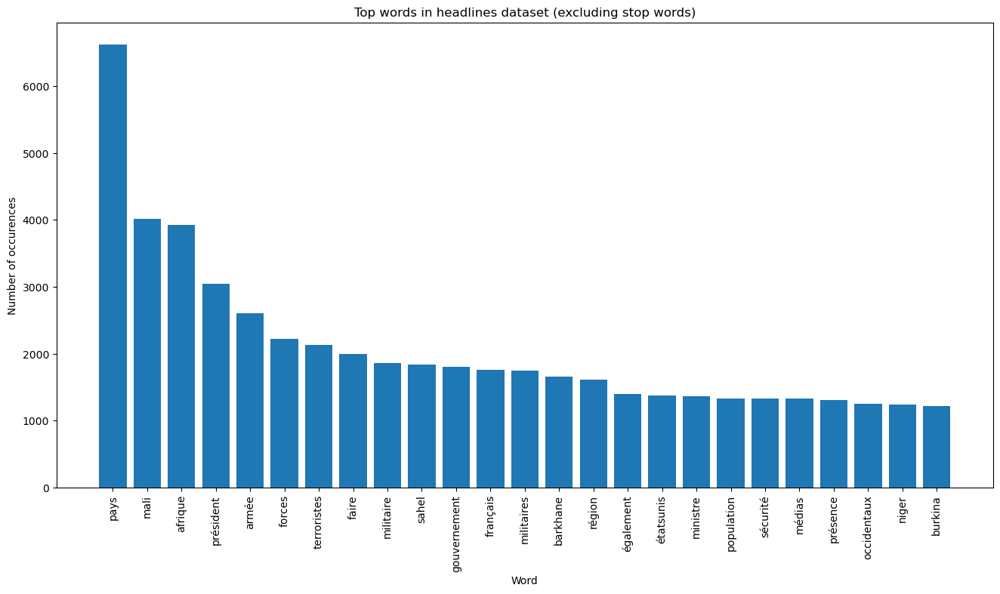

In [30]:
words, word_values = get_top_n_words(n_top_words=25,
                                     count_vectorizer=count_vectorizer, 
                                     text_data=reindexed_data)

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(range(len(words)), word_values);
ax.set_xticks(range(len(words)));
ax.set_xticklabels(words, rotation='vertical');
ax.set_title('Top words in headlines dataset (excluding stop words)');
ax.set_xlabel('Word');
ax.set_ylabel('Number of occurences');
plt.show()

In [31]:
tagged_headlines = [TextBlob(reindexed_data[i]).pos_tags for i in range(reindexed_data.shape[0])]

In [32]:
tagged_headlines_df = pd.DataFrame({'tags':tagged_headlines})

word_counts = [] 
pos_counts = {}

for headline in tagged_headlines_df[u'tags']:
    word_counts.append(len(headline))
    for tag in headline:
        if tag[1] in pos_counts:
            pos_counts[tag[1]] += 1
        else:
            pos_counts[tag[1]] = 1
            
print('Total number of words: ', np.sum(word_counts))
print('Mean number of words per artcle: ', np.mean(word_counts))

Total number of words:  1294711
Mean number of words per artcle:  1341.6694300518134


In [33]:
print('Article before vectorization: {}'.format(reindexed_data[123]))

term_matrix = count_vectorizer.fit_transform(reindexed_data)

print('Headline after vectorization: \n{}'.format(term_matrix[123]))

Article before vectorization: les analyses de la rédaction  – 1re opération commando israélienne sur le sol tunisien  les parties qui cherchent à plonger l’afrique du nord dans le chaos le plus total ont fait leur petit coup d’état jeudi en tunisie une offensive armée contre un relais de radiotélévision à gafsa sudouest deux attentats à tunis sur fond de rumeurs sur la mort du président béji caïd essebsi il est vrai que depuis les événements en algérie il y avait une volonté bien perceptible de pousser à une sorte de crescendo politique zoom maghreb ne revient pas sur le récit des événements mais sur ce qui les a précédés il y a deux semaines des centaines d’israéliens pour la plupart des militaires et des commandos se sont rendus en tunisie dans le cadre d’un pseudopèlerinage organisé par le ministère du tourisme à l’époque ce coup de force made in mossad a suscité l’indignation d’une majorité de tunisiens qui manif à l’appui ont commandé une invasion israélienne du sol tunisien qui n

In [34]:
n_topics = 6

### 3.3) Latent Dirichilet Allocation

In [35]:
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

def get_top_n_words_LDA(n, keys, document_term_matrix, count_vectorizer):
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = np.zeros((1, document_term_matrix.shape[1]))
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i].toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:], 0)
        top_word_indices.append(top_n_word_indices)
    
    top_words = []
    for topic in top_word_indices:
        topic_words = []
        for index in topic:
            temp_word_vector = np.zeros((1, document_term_matrix.shape[1]))
            temp_word_vector[:, index] = 1
            the_word = count_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word)
        top_words.append(" ".join(topic_words))
    
    return top_words

def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        articles_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                articles_in_that_topic.append(two_dim_vectors[i])    
        
        articles_in_that_topic = np.vstack(articles_in_that_topic)
        mean_article_in_that_topic = np.mean(articles_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_article_in_that_topic)
    return mean_topic_vectors

In [36]:
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [37]:
lda_model = LatentDirichletAllocation(n_components=n_topics, learning_method='online', random_state=0, verbose=0)

lda_topic_matrix = lda_model.fit_transform(term_matrix)

In [38]:

from collections import Counter

your_list = get_keys(lda_topic_matrix)

element_counts = Counter(your_list)

for element, count in element_counts.items():
    print(f"{element}: {count} times")


3: 262 times
4: 165 times
5: 124 times
2: 388 times
1: 25 times
0: 1 times


In [39]:
lda_keys = get_keys(lda_topic_matrix)
lda_categories, lda_counts = keys_to_counts(lda_keys)

Text(0, 0.5, 'Number of headlines')

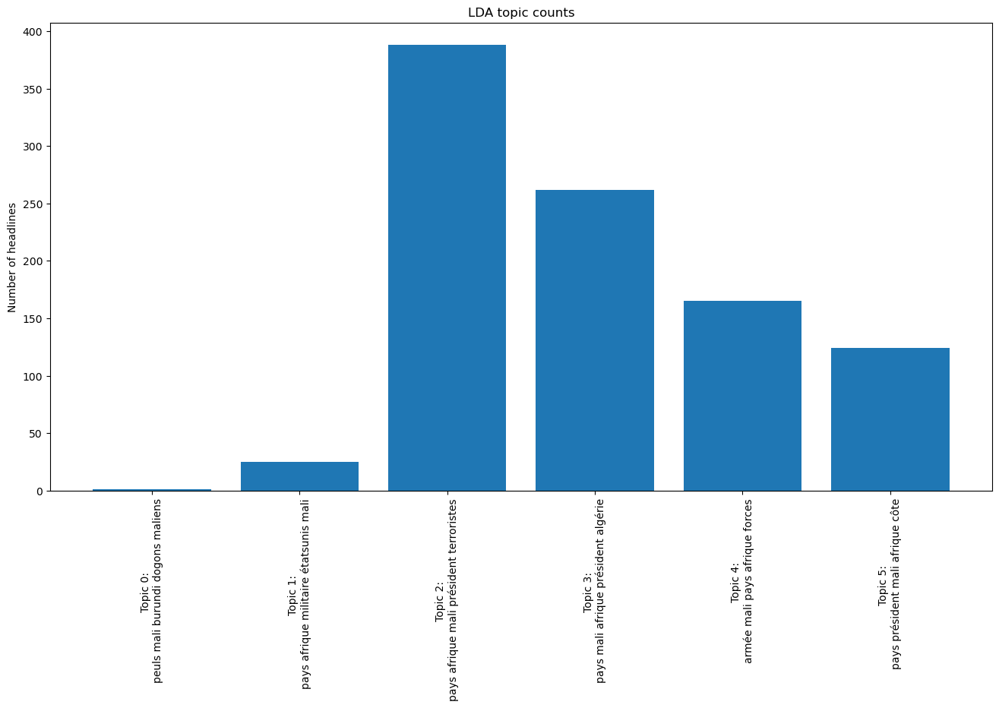

In [40]:
top_3_words = get_top_n_words_LDA(5, lda_keys, term_matrix, count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lda_categories]

fig, ax = plt.subplots(figsize=(16, 8))
ax.bar(lda_categories, lda_counts)
ax.set_xticks(lda_categories)
ax.set_xticklabels(labels)
ax.set_xticklabels(labels, rotation=90)
ax.set_title('LDA topic counts')
ax.set_ylabel('Number of headlines')

In [41]:
tsne_lda_model = TSNE(n_components=2, perplexity=50, learning_rate='auto', 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 965 samples in 0.010s...
[t-SNE] Computed neighbors for 965 samples in 0.040s...
[t-SNE] Computed conditional probabilities for sample 965 / 965
[t-SNE] Mean sigma: 0.006631
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.553703
[t-SNE] KL divergence after 2000 iterations: 0.554816


In [42]:
top_3_words_lda = get_top_n_words_LDA(5, lda_keys, term_matrix, count_vectorizer)
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics))
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color=colormap[t])
    plot.add_layout(label)

show(plot)

## 4) EDA

In [ ]:
df['cluster'] = lda_keys
df['vector1'] = tsne_lda_vectors[:, 0]
df['vector2'] = tsne_lda_vectors[:, 1]

In [ ]:
top_3_words_lda = get_top_n_words_LDA(30, lda_keys, term_matrix, count_vectorizer)

dict_clucter_30_words = {i: top_3_words_lda[i] for i in range(len(top_3_words_lda))}
dict_clucter_30_words

{0: 'ans police paris homme place lors forces faire français enquête samedi ordre également mort juillet mois juin ville novembre justice sputnik octobre dernier vue mis déjà suite 20 17 lieu',
 1: 'pays faire français monde ans cas santé millions gouvernement euros sputnik faut déjà covid19 mois crise politique sanitaire également notamment nombre situation temps président rapport fin face mars ministre années',
 2: 'pays président russie étatsunis afrique armée forces militaire français faire militaires guerre sécurité région gouvernement russe ministre également déclaré politique défense accord lors affaires française chef nord situation étrangères présence',
 3: 'pays cas ministre français mars annoncé covid19 déclaré avril dun atil dune cest gouvernement nombre santé lors janvier jours quil mai également président février indiqué 24 paris ministère presse situation',
 4: 'macron président français politique emmanuel pays ministre faire gouvernement république paris française pouvo

In [ ]:
dict_clucter_title = {
    0: 'International Relations and Security',
    1: 'Military Presence in Sahel Region',
    2: 'Algeria-Morocco Conflict Dynamics',
    3: 'Mali Crisis and Government Response',
    4: 'Global Perspectives on African Issues'
}

In [ ]:
df['cluster_30_words'] = df['cluster'].map(dict_clucter_30_words)
df['cluster_title'] = df['cluster'].map(dict_clucter_title)

In [ ]:
fig = px.scatter(df, x='vector1', y='vector2', color='cluster_title', hover_data=['title', 'description', 'domain'])
fig.update_layout(title='Scatter Plot with Cluster Colors and Keys')
fig.update_xaxes(title='Vector 1')
fig.update_yaxes(title='Vector 2')

fig.write_html("./html_images_cluster/Scatter_cluster.html")

fig.show()

## 5) Save df

In [ ]:
df_final_draft = df[['date', 'url', 'domain', 'title', 'cluster', 'vector1', 'vector2', 'cluster_30_words', 'cluster_title']]
df_final_draft.head(5)

,date,url,domain,title,cluster,vector1,vector2,cluster_30_words,cluster_title
0,2019-01-02,https://french.presstv.ir/Detail/2019/01/03/58...,french.presstv.ir,Des terroristes de l'Armée syrienne libre envo...,2,-27.939808,8.679305,algérie pays militaire armée maroc israël algé...,Algeria-Morocco Conflict Dynamics
1,2019-01-03,https://french.presstv.ir/Detail/2019/01/04/58...,french.presstv.ir,Zoom Afrique du 4 janvier 2019,3,9.868510,-13.643680,pays mali armée président afrique forces barkh...,Mali Crisis and Government Response
2,2019-01-03,https://french.presstv.ir/Detail/2019/01/04/58...,french.presstv.ir,Les terroristes veulent déstabiliser l’Algérie,2,-27.256174,8.257619,algérie pays militaire armée maroc israël algé...,Algeria-Morocco Conflict Dynamics
3,2019-01-04,https://french.presstv.ir/Detail/2019/01/05/58...,french.presstv.ir,Zoom Afrique du 5 janvier 2019,0,2.600644,-11.895773,pays afrique côte président mali ivoire faire ...,International Relations and Security
4,2019-01-05,https://french.presstv.ir/Detail/2019/01/06/58...,french.presstv.ir,Zoom Afrique du 6 janvier 2019,1,-7.249902,-10.655392,pays afrique mali terroristes sahel président ...,Military Presence in Sahel Region


In [ ]:
df_final_draft['domain'].unique()

array(['french.presstv.ir'], dtype=object)

In [ ]:
# Save the DataFrame to a JSON file

# df_final_draft.to_json('./results/df_final_LDA-countVect.csv')

In [ ]:
# df_final_draft.to_csv('./df_final_LDA-CountVect.csv', index=False)
